In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Fig2

## Panel b, in silico performance of cytoxicity prediction models

In [2]:
int_clls = ["BXPC3", "CAPAN", "CFPAC", "HPAFII", "PANC", "SW1990", 'HEK293']
standard_names = ["BXPC3", "CAPAN2", "CFPAC1", "HPAFII", "PANC10.05", "SW1990", "HEK293"]
clls2name = dict(zip(int_clls, standard_names))

In [3]:
df = pd.DataFrame()
for cll in int_clls[:-1]:
    dir_ = "../extra_data/cytotoxicity_prediction_stats/"
    df_cll = pd.DataFrame()
    for file in os.listdir(dir_):
        if np.logical_and(".csv" in file, "%s" % cll in file):
            if "_kbest" in file or "_pca" in file:
                results = pd.read_csv(dir_ + file, skipfooter=2, engine='python') # last 2 rows have the mean and SD info, so we skip them
                aux = pd.DataFrame(
                    {"avg_precision": results["avPrecision"].values} 
                )
                aux["auroc"] = results["AUROC"].values
                if "_pca" in file:
                    aux["descriptor"] = ["ECFP4"] * 10
                else:
                    aux["descriptor"] = ["CC_GLOBAL"] * 10
                df_cll = pd.concat([df_cll, aux])
        df_cll["cell"] = [cll] * len(df_cll)
    df = pd.concat([df, df_cll], ignore_index=True)

In [4]:
df

,cell,avg_precision,auroc,descriptor
0,BXPC3,0.457667,0.799319,CC_GLOBAL
1,BXPC3,0.416423,0.885402,CC_GLOBAL
2,BXPC3,0.531186,0.841463,CC_GLOBAL
3,BXPC3,0.474416,0.878766,CC_GLOBAL
4,BXPC3,0.539284,0.857851,CC_GLOBAL
...,...,...,...,...
115,SW1990,0.851606,0.926521,ECFP4
116,SW1990,0.640904,0.826349,ECFP4
117,SW1990,0.718906,0.817738,ECFP4
118,SW1990,0.544275,0.708094,ECFP4


In [5]:
df.isnull().sum()   

cell             0
avg_precision    0
auroc            0
descriptor       0
dtype: int64

In [6]:
df['cell'].unique()

array(['BXPC3', 'CAPAN', 'CFPAC', 'HPAFII', 'PANC', 'SW1990'],
      dtype=object)

In [7]:
hek_cv = pd.read_csv(
    "../extra_data/cytotoxicity_prediction_stats//cv_activity_predictor_HEK293_kbest.csv"
) 

In [8]:
hek_cv["cell"] = ["HEK293"] * len(hek_cv)
hek_cv["descriptor"] = ["CC_GLOBAL"] * len(hek_cv)
hek_cv.rename(columns={"AUROC": "auroc", "avPrecision": "avg_precision"}, inplace=True)

In [9]:
df = pd.concat([df, hek_cv], ignore_index=True)

In [10]:
DESCRIPTORS = ["CC_GLOBAL", "ECFP4"]
COLORS = ["#007A87", "#FF5A5F"]

POSITIONS = np.arange(0, len(int_clls), 1)
deviations = [-0.2, 0.2]


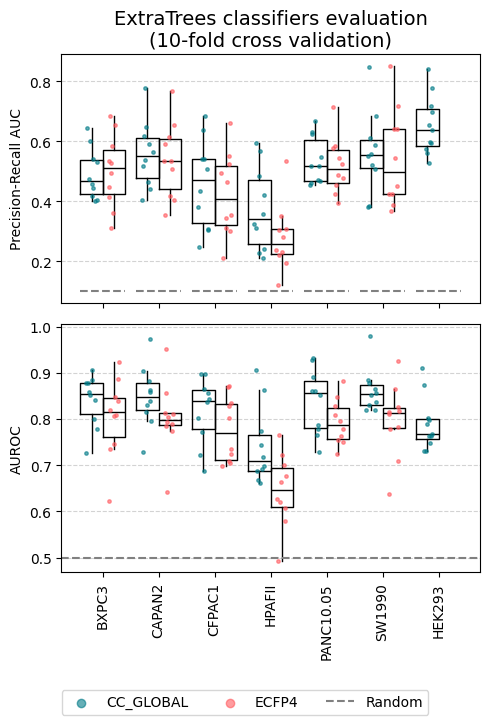

In [11]:
def create_raincloud_plot(ax, df, metric):
    POSITIONS = np.arange(0, len(int_clls ), 1)
    deviations = [-0.2, 0.2]

    medianprops = {"linewidth": 1, "color": "black", "solid_capstyle": "butt"}
    boxprops = {"linewidth": 1, "color": "black"}

    for a, cll in enumerate(int_clls):
        aux = df[df["cell"] == cll].copy()
        for i, descriptor in enumerate(DESCRIPTORS):
            try:
                position = POSITIONS[a]
                data = aux[aux["descriptor"] == descriptor]
                x = (
                    position
                    + deviations[i]
                    - 0.1
                    + np.random.uniform(high=0.2, size=len(data))
                )
                y = data[metric]
                ax.scatter(x, y, color=COLORS[i], alpha=0.6, s=6, zorder=2)
            except:
                continue

        boxplot_data = [
            aux[aux["descriptor"] == descriptor][metric].values
            for descriptor in DESCRIPTORS
        ]
        ax.boxplot(
            boxplot_data,
            vert=True,
            positions=np.array(deviations) + POSITIONS[a],
            manage_ticks=False,
            widths=0.4,
            showfliers=False,
            showcaps=False,
            medianprops=medianprops,
            whiskerprops=boxprops,
            boxprops=boxprops,
            zorder=1,
        )

    ax.set_xticks(POSITIONS, labels=int_clls , rotation=90)
    ax.set_axisbelow(True)
    ax.grid(axis="y", ls="--", color="lightgrey")


# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5, 6.5), sharex=True)

# Create the first plot (avg_precision)
create_raincloud_plot(ax1, df, "avg_precision")
# Add random
# ax1.axhline(y=0.1, color="gray", linestyle="--", label="Random", zorder=1)
random_baselines = [0.1] * (len(int_clls)) + [0.454]
for pos, baseline in zip(POSITIONS, random_baselines):
    ax1.hlines(y=baseline, xmin=pos-0.4, xmax=pos+0.4, colors='gray', linestyles='--', zorder=0)

# Custom labels
ax1.set_ylabel("Precision-Recall AUC")

# Create the second plot (AUROC)
create_raincloud_plot(ax2, df, "auroc")
# Add random
ax2.axhline(y=0.5, color="gray", linestyle="--", label="Random", zorder=1)
# Custom labels
ax2.set_ylabel("AUROC")

# Add a common legend at the bottom
handles = [
    plt.scatter([], [], c=COLORS[i], label=descriptor, alpha=0.6)
    for i, descriptor in enumerate(DESCRIPTORS)
]
# Add the dashed line to the legend
handles.append(plt.Line2D([], [], color="gray", linestyle="--", label="Random"))
fig.legend(
    handles=handles,
    labels=DESCRIPTORS + ["Random"],
    loc="lower center",
    ncol=3,
    bbox_to_anchor=(0.5, -0.05),
)

# Adjust the layout
plt.tight_layout()
plt.subplots_adjust(bottom=0.18)  # Make room for the legend

# Sup title
ax1.set_title(
    "ExtraTrees classifiers evaluation\n(10-fold cross validation)", fontsize=14
)

ax2.set_xticks(POSITIONS, labels=standard_names, rotation=90)

# Display the plot (optional, remove if you don't want to show the plot)
plt.show()

## Panel c, odds ratio predictions vs HTS 

In [3]:
import matplotlib.colors as mcolors

# Create a YlGnBu colormap
cmap = plt.get_cmap("YlGnBu")

# Divide the colormap into 6 colors
colors = [cmap(i / 5) for i in range(6)]

PC_cells_colors = [mcolors.rgb2hex(color) for color in colors]

In [4]:
from scipy import stats
from sklearn import metrics

In [5]:
cpds_to_validate_predictions = pd.read_excel(
    "../../drug screening data/Validation of prediction models.xlsx", sheet_name="Validate predictions"
)
hts = pd.read_excel(
    "../../drug screening data/HTS_and_confirmation.xlsx", sheet_name="HTS"
)

In [6]:
hts.columns

Index(['SMILES', 'Supplier', 'Supplier Ref', 'CLNUMBER', 'Conc', '%Inh CAPAN2',
       '%Inh SW1990', '%Inh BXPC3', '%Inh HPAFII', '%Inh CFPAC1',
       '%Inh PANC10.05', '%Inh AsPC-1', 'in_plate_selection',
       'positives CAPAN2', 'positives SW1990', 'positives BXPC3',
       'positives HPAFII', 'positives CFPAC1', 'positives PANC10.05',
       'positives AsPC-1'],
      dtype='object')

In [7]:
cpds_to_validate_predictions.shape

(244, 28)

In [8]:
cpds_to_validate_predictions.head()

,SMILES,Supplier,Supplier Ref,Conc,%Inh PANC10.05_mean,%Inh PANC10.05 rep1,%Inh PANC10.05 rep2,%Inh BXPC3_mean,%Inh BXPC3 rep1,%Inh BXPC3 rep2,...,%Inh HEK293 rep2,%Inh HPAFII_mean,%Inh HPAFII rep1,%Inh HPAFII rep2,%Inh SW1990_mean,%Inh SW1990 rep1,%Inh SW1990 rep2,%Inh U2OS_mean,%Inh U2OS rep1,%Inh U2OS rep2
0,Fc1ccc(Nc2c3c(nc4ccccc24)CCC3)cc1,ChemDiv (IRB library),C066-2943,10 uM,6.46325,5.7331,7.1934,9.42125,3.7035,15.1390,...,58.428,11.11565,8.9683,13.2630,35.88700,35.4000,36.3740,8.0791,5.9042,10.2540
1,COc1ccc(Nc2ncc(F)c(Nc3ccc(OC)c(Cl)c3)n2)cc1Cl,ChemDiv (IRB library),8014-9225,10 uM,-3.90540,-5.9955,-1.8153,11.84265,9.7073,13.9780,...,19.209,3.25975,2.5293,3.9902,8.42425,5.0065,11.8420,15.2420,13.5620,16.9220
2,CC1=CC(C)(C)Nc2ccc(OC(=O)c3cccc(F)c3)cc21,ChemDiv (IRB library),7399-0518,10 uM,0.46145,-0.8268,1.7497,0.10610,-1.2132,1.4254,...,53.005,-3.86785,-5.7616,-1.9741,12.84660,9.5732,16.1200,16.9170,15.9980,17.8360
3,O=C(CC1(O)C(=O)N(CCc2ccccc2)c2ccc(Br)cc21)c1cccs1,ChemDiv (IRB library),7407-0849,10 uM,-4.84130,-8.5133,-1.1693,-3.98030,-4.1137,-3.8469,...,30.595,8.18105,7.6447,8.7174,4.42495,3.0707,5.7792,0.6605,-3.4552,4.7762
4,Clc1ccccc1Nc1nc2ccccc2o1,ChemDiv (IRB library),8015-0571,10 uM,22.75255,20.9072,24.5979,43.84450,42.5470,45.1420,...,49.945,47.44550,46.6570,48.2340,47.89600,44.7160,51.0760,44.0535,42.9820,45.1250


In [9]:
thresholds = {
    "CAPAN2": np.mean(hts['%Inh CAPAN2'])+np.std(hts['%Inh CAPAN2'])*2.5,
    "SW1990": np.mean(hts['%Inh SW1990'])+np.std(hts['%Inh SW1990'])*2.5,
    "BXPC3": np.mean(hts['%Inh BXPC3'])+np.std(hts['%Inh BXPC3'])*2.5,
    "HPAFII": np.mean(hts['%Inh HPAFII'])+np.std(hts['%Inh HPAFII'])*2.5,
    "CFPAC1": np.mean(hts['%Inh CFPAC1'])+np.std(hts['%Inh CFPAC1'])*2.5,
    "PANC10.05": np.mean(hts['%Inh PANC10.05'])+np.std(hts['%Inh PANC10.05'])*2.5,
}

In [10]:
for cll in standard_names[:-1]: # skip HEKs
    cpds_to_validate_predictions[f'actives_{cll}'] = cpds_to_validate_predictions.apply(
        lambda row: (row[f'%Inh {cll}_mean'] > thresholds[cll])*1, axis=1
    )

In [11]:
cpds_to_validate_predictions.columns

Index(['SMILES', 'Supplier', 'Supplier Ref', 'Conc', '%Inh PANC10.05_mean',
       '%Inh PANC10.05 rep1', '%Inh PANC10.05 rep2', '%Inh BXPC3_mean',
       '%Inh BXPC3 rep1', '%Inh BXPC3 rep2', '%Inh CAPAN2_mean',
       '%Inh CAPAN2 rep1', '%Inh CAPAN2 rep2', '%Inh CFPAC1_mean',
       '%Inh CFPAC1 rep1', '%Inh CFPAC1 rep2', '%Inh HEK293_mean',
       '%Inh HEK293 rep1', '%Inh HEK293 rep2', '%Inh HPAFII_mean',
       '%Inh HPAFII rep1', '%Inh HPAFII rep2', '%Inh SW1990_mean',
       '%Inh SW1990 rep1', '%Inh SW1990 rep2', '%Inh U2OS_mean',
       '%Inh U2OS rep1', '%Inh U2OS rep2', 'actives_BXPC3', 'actives_CAPAN2',
       'actives_CFPAC1', 'actives_HPAFII', 'actives_PANC10.05',
       'actives_SW1990'],
      dtype='object')

In [12]:
import pickle
for cll in int_clls[:-1]: # skip HEKs
    with open(
        "../extra_data/prediction_scores_IRB_library/%s_probabilities"
        % cll,
        "rb",
    ) as f:
        cpd2prob = pickle.load(f)

    cll = clls2name[cll]
    cpds_to_validate_predictions["score %s" % cll] = [
        cpd2prob[x] for x in cpds_to_validate_predictions["Supplier Ref"]
    ]

/tmp/ipykernel_41567/2730130434.py:8: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  cpd2prob = pickle.load(f)
/tmp/ipykernel_41567/2730130434.py:8: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  cpd2prob = pickle.load(f)
/tmp/ipykernel_41567/2730130434.py:8: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  cpd2prob = pickle.load(f)
/tmp/ipykernel_41567/2730130434.py:8: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  cpd2prob = pickle.load(f)


In [13]:
hts.head(2)

,SMILES,Supplier,Supplier Ref,CLNUMBER,Conc,%Inh CAPAN2,%Inh SW1990,%Inh BXPC3,%Inh HPAFII,%Inh CFPAC1,%Inh PANC10.05,%Inh AsPC-1,in_plate_selection,positives CAPAN2,positives SW1990,positives BXPC3,positives HPAFII,positives CFPAC1,positives PANC10.05,positives AsPC-1
0,CCN(CC)C(=O)Cn1cnc2sc(C(=O)NCCCOC)c(C)c2c1=O,ChemDiv (IRB library),3909-8560,CL1572,10 uM,27.1236,10.3256,1.3229,5.8391,-1.5997,6.6135,6.3664,0,0,0,0,0,0,0,0
1,Cc1sc(-n2c(C)c3c(C)nnc(C)c3c2C)nc1-c1cccs1,ChemDiv (IRB library),6557-0199,CL2941,10 uM,6.6508,1.5008,1.1223,5.7181,14.7236,10.6087,-3.4527,0,0,0,0,0,0,0,0


In [14]:
thresholds_ = [[0, 0.2], [0.2, 0.4], [0.4, 0.6], [0.6, 0.8], [0.8, 1]]

enrichments_all_clls = []
pvalues_all_clls = []
for cll in standard_names[:-1]: # skip HEKs
    hts_to_compare = hts.copy()
    hts_to_compare = hts_to_compare[['Supplier Ref', 'positives %s'%cll]].dropna()

    enrichments, pvalues = [], []
    for t in thresholds_:
        predicted_cpds = cpds_to_validate_predictions.copy()
        predicted_cpds = predicted_cpds[
            np.logical_and(
                predicted_cpds["score %s" % cll] >= t[0],
                predicted_cpds["score %s" % cll] < t[1],
            )
        ]

        enrichment_df = pd.DataFrame()
        enrichment_df["Supplier Ref"] = list(
            predicted_cpds["Supplier Ref"].values
        ) + list(hts_to_compare["Supplier Ref"].values)

        enrichment_df["Active"] = list(
            predicted_cpds["actives_%s" % cll].values
        ) + list(hts_to_compare["positives %s" % cll].values)
        enrichment_df["Predictor"] = [1] * len(predicted_cpds) + [0] * len(
            hts_to_compare
        )
        confusion_matrix = metrics.confusion_matrix(
            enrichment_df["Active"].values, enrichment_df["Predictor"]
        )
        fisher = stats.fisher_exact(confusion_matrix)
        enrichments.append(fisher[0])
        pvalues.append(fisher[1])

    enrichments_all_clls.append(enrichments)
    pvalues_all_clls.append(pvalues)

In [15]:
enrichment_df

,Supplier Ref,Active,Predictor
0,3909-8560,0,0
1,6557-0199,0,0
2,3909-9330,0,0
3,6557-0202,0,0
4,3910-0329,0,0
...,...,...,...
11048,Y020-1716,0,0
11049,Y040-3703,0,0
11050,Y040-5317,0,0
11051,Y200-2351F,0,0


In [16]:
pvalues_all_clls

[[np.float64(0.0706550510297977),
  np.float64(2.644935243027334e-07),
  np.float64(1.4701141319438552e-06),
  np.float64(0.00047187443518251513),
  1.0],
 [np.float64(0.37492364546197143),
  np.float64(0.03146220353344508),
  np.float64(5.71549148609356e-07),
  np.float64(1.9762113427059273e-09),
  np.float64(0.0004778653594830585)],
 [1.0,
  np.float64(5.881401876851384e-07),
  np.float64(0.0012356499989599223),
  np.float64(0.12078266327649194),
  1.0],
 [np.float64(0.0017056488568851088),
  np.float64(3.744394950327576e-06),
  np.float64(1.3417838824320236e-06),
  np.float64(0.11487238553165671),
  np.float64(0.0024839439608240095)],
 [1.0,
  np.float64(0.042257482356104534),
  np.float64(0.07166274367561905),
  np.float64(0.0208359008049661),
  1.0],
 [np.float64(0.011690285583109566),
  np.float64(0.0022406054039355314),
  np.float64(4.7522865877044574e-05),
  np.float64(8.364104725215134e-05),
  1.0]]

In [17]:
enrichments_all_clls

[[np.float64(2.148471615720524),
  np.float64(8.812375101768929),
  np.float64(15.755458515283843),
  np.float64(28.35982532751092),
  nan],
 [np.float64(0.3337341967314215),
  np.float64(4.705652173913044),
  np.float64(13.9426731078905),
  np.float64(24.91227621483376),
  np.float64(28.23391304347826)],
 [np.float64(0.9017578125),
  np.float64(7.2140625),
  np.float64(7.125),
  np.float64(9.61875),
  nan],
 [np.float64(4.391873278236915),
  np.float64(12.648595041322315),
  np.float64(34.748887476160206),
  np.float64(9.034710743801654),
  np.float64(36.138842975206614)],
 [np.float64(0.9512647058823529),
  np.float64(3.235594237695078),
  np.float64(3.3030024509803924),
  np.float64(5.662289915966387),
  nan],
 [np.float64(2.5893344025661587),
  np.float64(4.948505747126437),
  np.float64(8.659885057471264),
  np.float64(14.274535809018568),
  nan]]

In [18]:
int_clls

['BXPC3', 'CAPAN', 'CFPAC', 'HPAFII', 'PANC', 'SW1990', 'HEK293']

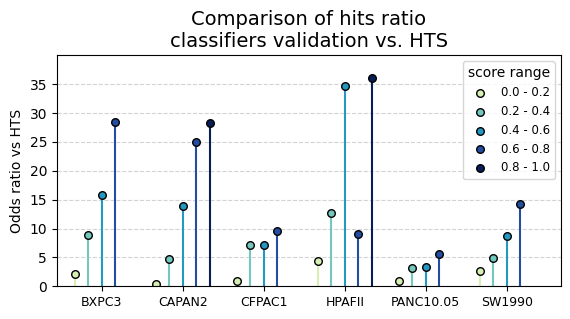

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# Replace NaN values with 0 in enrichments_all_clls
enrichments_all_clls = [np.nan_to_num(arr, nan=-99) for arr in enrichments_all_clls]

n_clls = len(int_clls[:-1])
n_ranges = len(enrichments_all_clls[0])  # Assuming all arrays have the same length

fig, ax = plt.subplots(figsize=(6.5, 3))

x = np.arange(0, 1, 0.18)  # 5 x positions
width = 0.03  # Width for spacing between lollipops

# Define colors for classifier score ranges
colors = PC_cells_colors[1:]

for i in range(n_ranges):
    # Calculate x positions for this classifier score range
    x_positions = x + i * width

    # Get the enrichment values for this range across all CLLs
    y_values = [cll[i] for cll in enrichments_all_clls]

    # Plot the stem without the baseline
    ax.stem(x_positions, y_values, linefmt=colors[i], markerfmt=" ", bottom=-1)

    # Plot the lollipop head
    ax.scatter(
        x_positions,
        y_values,
        color=colors[i],
        s=30,
        label=f"{i*0.2:.1f} - {(i+1)*0.2:.1f}",
        edgecolors="black",
        zorder=2,
    )

# Add legend
ax.legend(title="score range", fontsize=8.5)

# Add labels and title
# Set x-ticks and labels
ax.set_xticks(x + (n_ranges - 1) * width / 2)  # Center x-ticks
ax.set_xticklabels(standard_names[:-1], ha="center", fontsize=9)

ax.grid(axis="y", ls="--", color="lightgrey", zorder=0)
ax.set_ylabel("Odds ratio vs HTS")
ax.set_title(
    "Comparison of hits ratio\nclassifiers validation vs. HTS",
    fontsize=14,
)
ax.set_yticks(np.arange(0, 35.5, 5))
ax.set_ylim(0, 40)
ax.set_xlim(-0.04, 1.08)

plt.show()

# Supplementary Figure 5, Predicted score vs Tanimoto for IRB library and selected compounds to test

In [ ]:
irb_library = pd.read_csv(
    "../extra_data/irb_library.csv"
)
training = pd.read_excel('../../drug screening data/HTS_and_confirmation.xlsx', sheet_name="Training set")

In [33]:
from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem


def compute_max_tanimoto(query_cpds, cpds_to_compare):
    """The first array must be the query one, and the second one, the one to compare with"""
    # Get the molecules
    mols_A = [Chem.MolFromSmiles(s) for s in query_cpds]
    mols_B = [Chem.MolFromSmiles(s) for s in cpds_to_compare]
    # Compute Morgan fingerprints
    fps_A = [
        Chem.AllChem.GetMorganFingerprintAsBitVect(m, 2, nBits=2048) for m in mols_A
    ]
    fps_B = [
        Chem.AllChem.GetMorganFingerprintAsBitVect(m, 2, nBits=2048) for m in mols_B
    ]
    # Compute tanimoto similarity and take max one
    max_sims = []
    indexes = []
    for i in range(len(fps_A)):
        sims = DataStructs.BulkTanimotoSimilarity(fps_A[i], fps_B)
        max_sims.append(max(sims))
        index = np.where(np.array(sims) == max(sims))[0][0]
        indexes.append(index)
        # img=Chem.Draw.MolsToGridImage([mols_A[i],mols_B[index]],molsPerRow=2,subImgSize=(400,200), returnPNG=True, legends=['Closest tested CPD (tanimoto = %.2f)'%max(sims), 'Predicted (score = %.2f)'%smiles2score[query_cpds[i]]])
        # with open('./plots/%s_pred_%d.png'%(cll,i),'wb') as f:
        #   f.write(img.data)
    return np.array(max_sims), np.array(indexes)

In [34]:
cpd2smiles = dict(zip(irb_library["Supplier Ref"], irb_library["SMILES"]))

In [35]:
irb_library.columns

Index(['ID', 'Supplier', 'Supplier Ref', 'SMILES'], dtype='object')

In [36]:
cpds_tested = cpds_to_validate_predictions

In [37]:
cpds_tested.columns

Index(['SMILES', 'Supplier', 'Supplier Ref', 'Conc', '%Inh PANC10.05_mean',
       '%Inh PANC10.05 rep1', '%Inh PANC10.05 rep2', '%Inh BXPC3_mean',
       '%Inh BXPC3 rep1', '%Inh BXPC3 rep2', '%Inh CAPAN2_mean',
       '%Inh CAPAN2 rep1', '%Inh CAPAN2 rep2', '%Inh CFPAC1_mean',
       '%Inh CFPAC1 rep1', '%Inh CFPAC1 rep2', '%Inh HEK293_mean',
       '%Inh HEK293 rep1', '%Inh HEK293 rep2', '%Inh HPAFII_mean',
       '%Inh HPAFII rep1', '%Inh HPAFII rep2', '%Inh SW1990_mean',
       '%Inh SW1990 rep1', '%Inh SW1990 rep2', '%Inh U2OS_mean',
       '%Inh U2OS rep1', '%Inh U2OS rep2', 'actives_BXPC3', 'actives_CAPAN2',
       'actives_CFPAC1', 'actives_HPAFII', 'actives_PANC10.05',
       'actives_SW1990', 'score BXPC3', 'score CAPAN2', 'score CFPAC1',
       'score HPAFII', 'score PANC10.05', 'score SW1990'],
      dtype='object')

In [38]:
# Create the plot
from matplotlib.colors import LinearSegmentedColormap


# Function to truncate a colormap
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = LinearSegmentedColormap.from_list(
        f"trunc({cmap.name},{minval:.2f},{maxval:.2f})",
        cmap(np.linspace(minval, maxval, n)),
    )
    return new_cmap


# Original and truncated colormap
original_cmap = plt.cm.Blues
truncated_cmap = truncate_colormap(
    original_cmap, minval=0.1, maxval=1.0
)  # Adjust `minval` and `maxval`

/tmp/ipykernel_41567/1674236002.py:11: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  cpd2prob = pickle.load(f)
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please use MorganGenerator
[15:50:35] DEPRECATION WARNING: please us

0.24 0.9772727272727273
0.04 0.89


[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerator
[15:51:42] DEPRECATION WARNING: please use MorganGenerat

0.2777777777777778 0.9772727272727273
0.01 0.89


[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerator
[15:52:46] DEPRECATION WARNING: please use MorganGenerat

0.23404255319148937 0.9772727272727273
0.02 0.77


[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerator
[15:53:45] DEPRECATION WARNING: please use MorganGenerat

0.22950819672131148 0.9772727272727273
0.01 0.91


[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerator
[15:55:13] DEPRECATION WARNING: please use MorganGenerat

0.2692307692307692 0.9814814814814815
0.0 0.9


[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerator
[15:56:33] DEPRECATION WARNING: please use MorganGenerat

0.2777777777777778 0.9814814814814815
0.01 0.93


[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerator
[15:58:11] DEPRECATION WARNING: please use MorganGenerat

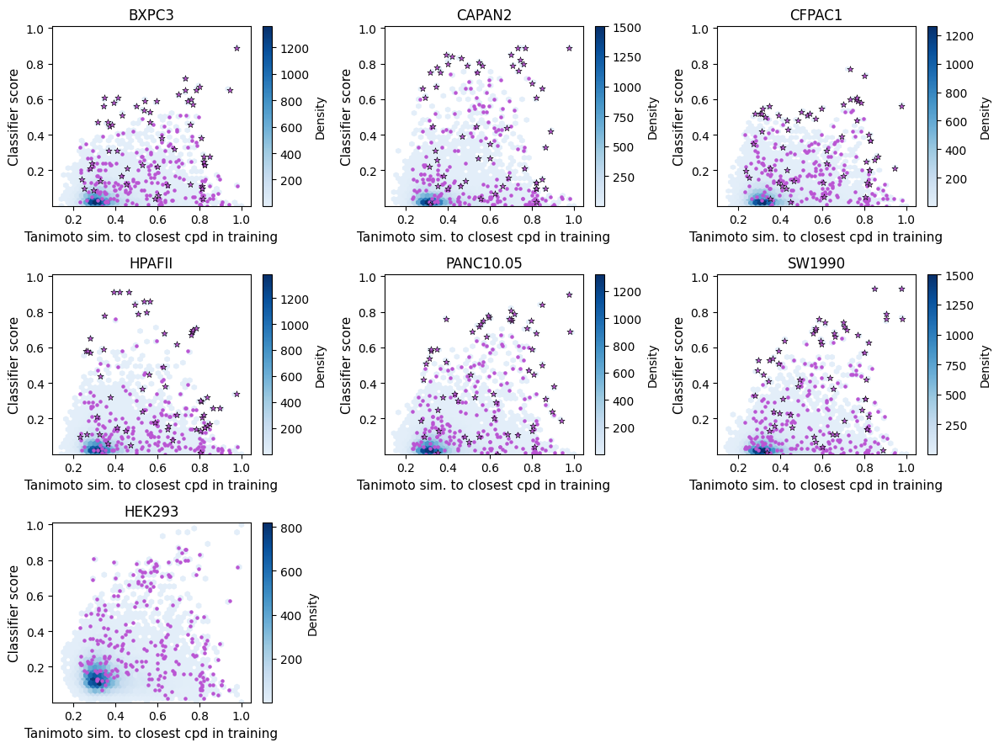

In [39]:
fig, axs = plt.subplots(3, 3, figsize=(12, 9))
axs = axs.ravel()

for i, cll in enumerate(int_clls ):
    ax = axs[i]
    with open(
        "../extra_data/prediction_scores_IRB_library/%s_probabilities"
        % cll,
        "rb",
    ) as f:
        cpd2prob = pickle.load(f)
    cpds = np.array(list(cpd2prob))
    probs = np.array([cpd2prob[cpd] for cpd in cpds])
    cpds_t = cpds_tested["Supplier Ref"].values

    # Filter
    mask_f = np.isin(cpds, hts["Supplier Ref"])
    probs_f = probs[~mask_f]
    cpds_f = cpds[~mask_f]

    cpds_f_smiles = [cpd2smiles[c] for c in cpds_f]
    cpds_f_score = np.array([cpd2prob[c] for c in cpds_f])

    tanimotos, indexes = compute_max_tanimoto(cpds_f_smiles, training["SMILES"].values)
    cpds2tanimoto = dict(zip(cpds_f, tanimotos))

    hb = ax.hexbin(
        tanimotos,
        cpds_f_score,
        gridsize=40,  # Adjust the resolution of the hexbin grid
        cmap=truncated_cmap,
        mincnt=1,  # To ensure cells with at least one data point are colored
    )

    # Add a color bar
    cb = fig.colorbar(hb, ax=ax)
    cb.set_label("Density")

    # Customize labels and ticks
    ax.set_ylabel("Classifier score", fontsize=11)
    ax.set_xlabel("Tanimoto sim. to closest cpd in training", fontsize=11)
    ax.set_xticks(np.arange(0.2, 1.01, 0.2))
    ax.set_yticks(np.arange(0.2, 1.01, 0.2))
    ax.set_ylim(0, 1.01)

    ax.tick_params(axis="x")
    ax.tick_params(axis="y")
    ax.set_title(clls2name[cll])
    if cll != "HEK293":
        with open(
            "../extra_data/prediction_scores_IRB_library/%s_best_preds.p"
            % cll,
            "rb",
        ) as f:
            high_probs = pickle.load(f)
        high_probs = np.array(list(high_probs.values())).flatten()
        with open(
            "../extra_data/prediction_scores_IRB_library/%s_worst_preds.p"
            % cll,
            "rb",
        ) as f:
            low_probs = pickle.load(f)
        low_probs = np.array(list(low_probs.values())).flatten()
        cpds_s = list(low_probs) + list(high_probs)

        tanimotos_selected = [cpds2tanimoto[c] for c in cpds_s]
        score_selected = [cpd2prob[c] for c in cpds_s]

        ax.scatter(
            tanimotos_selected,
            score_selected,
            s=30,
            color="mediumorchid",
            zorder=2,
            marker="*",
            edgecolor="black",
            lw=0.4,
            label="CPDs selected for %s" % cll,
        )
        cpds_t = cpds_tested[~cpds_tested["Supplier Ref"].isin(cpds_s)][
            "Supplier Ref"
        ].values

    # CPDs tested
    tanimotos_t = [cpds2tanimoto[c] for c in cpds_t]
    score_t = [cpd2prob[c] for c in cpds_t]
    ax.scatter(
        tanimotos_t, score_t, s=5, color="mediumorchid", zorder=1, label="CPDs tested"
    )
    
for ax in axs[7:]:
    ax.axis("off")
plt.tight_layout()
plt.show()
plt.close()

# Supplementary Fig 6, %inhibition vs predicted score predicted molecules

In [40]:
cpds_to_validate_predictions.head()

,SMILES,Supplier,Supplier Ref,Conc,%Inh PANC10.05_mean,%Inh PANC10.05 rep1,%Inh PANC10.05 rep2,%Inh BXPC3_mean,%Inh BXPC3 rep1,%Inh BXPC3 rep2,...,actives_CFPAC1,actives_HPAFII,actives_PANC10.05,actives_SW1990,score BXPC3,score CAPAN2,score CFPAC1,score HPAFII,score PANC10.05,score SW1990
0,Fc1ccc(Nc2c3c(nc4ccccc24)CCC3)cc1,ChemDiv (IRB library),C066-2943,10 uM,6.46325,5.7331,7.1934,9.42125,3.7035,15.1390,...,0,0,0,0,0.590000,0.68,0.55,0.34,0.36,0.43
1,COc1ccc(Nc2ncc(F)c(Nc3ccc(OC)c(Cl)c3)n2)cc1Cl,ChemDiv (IRB library),8014-9225,10 uM,-3.90540,-5.9955,-1.8153,11.84265,9.7073,13.9780,...,0,0,0,0,0.390000,0.52,0.49,0.16,0.32,0.29
2,CC1=CC(C)(C)Nc2ccc(OC(=O)c3cccc(F)c3)cc21,ChemDiv (IRB library),7399-0518,10 uM,0.46145,-0.8268,1.7497,0.10610,-1.2132,1.4254,...,0,0,0,0,0.089091,0.44,0.16,0.12,0.06,0.07
3,O=C(CC1(O)C(=O)N(CCc2ccccc2)c2ccc(Br)cc21)c1cccs1,ChemDiv (IRB library),7407-0849,10 uM,-4.84130,-8.5133,-1.1693,-3.98030,-4.1137,-3.8469,...,0,0,0,0,0.020000,0.02,0.08,0.00,0.00,0.01
4,Clc1ccccc1Nc1nc2ccccc2o1,ChemDiv (IRB library),8015-0571,10 uM,22.75255,20.9072,24.5979,43.84450,42.5470,45.1420,...,1,1,0,1,0.350000,0.33,0.24,0.58,0.32,0.09


In [41]:
tanimotos, indexes = compute_max_tanimoto(
    cpds_to_validate_predictions["SMILES"], training["SMILES"].values
)

[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerator
[16:02:23] DEPRECATION WARNING: please use MorganGenerat

In [42]:
tanimotos_dict = dict(zip(cpds_to_validate_predictions["Supplier Ref"], tanimotos))
indexes_dict = dict(zip(cpds_to_validate_predictions["Supplier Ref"], indexes))

In [48]:
thresholds['HEK293'] = np.percentile(training['%Inh HEK293'], 75)

In [52]:
# Load predicted probabilities for HEK293
with open(
    "../extra_data/prediction_scores_IRB_library/HEK293_probabilities",
    "rb",
) as f:
    cpd2prob = pickle.load(f)

probs = np.array([cpd2prob[cpd] for cpd in cpds_to_validate_predictions["Supplier Ref"]])
cpds_to_validate_predictions["score HEK293"] = probs

/tmp/ipykernel_41567/3717903295.py:6: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  cpd2prob = pickle.load(f)


BXPC3: 244 compounds plotted
CAPAN2: 244 compounds plotted
CFPAC1: 244 compounds plotted
HPAFII: 244 compounds plotted
PANC10.05: 244 compounds plotted
SW1990: 244 compounds plotted
HEK293: 244 compounds plotted


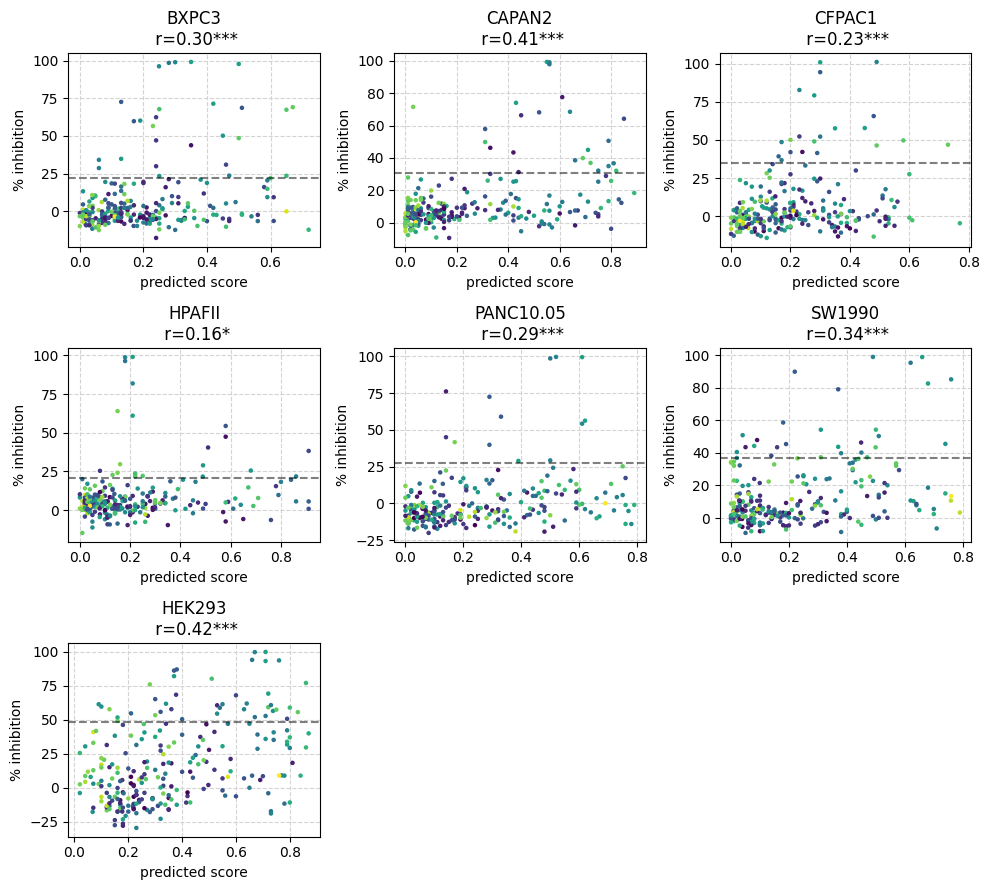

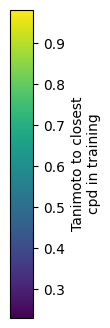

In [53]:
from scipy.stats import pearsonr

fig1, ax = plt.subplots(3, 3, figsize=(10, 9))

t = [tanimotos_dict[s] for s in cpds_to_validate_predictions["Supplier Ref"]]
# Create a list to store scatter plot objects
scatter_plots = []

for i, cll in enumerate(standard_names):
    probs = cpds_to_validate_predictions[f"score {cll}"]
    y = cpds_to_validate_predictions[f"%Inh {cll}_mean"]
    print(f"{cll}: {len(probs)} compounds plotted")
    ax_ = ax.flatten()[i]
    # [Rest of your existing data processing code...]
    scatter = ax_.scatter(
        probs,
        y,
        s=5,
        c=t,
        cmap="viridis",
        zorder=2,
    )
    scatter_plots.append(scatter)

    ax_.axhline(y=thresholds[cll], linestyle="--", color="black", alpha=0.5)
    ax_.grid(ls="--", color="lightgrey", zorder=0)
    ax_.set_ylabel("% inhibition")
    ax_.set_xlabel("predicted score")
    ax_.set_title(cll)

# Compute Pearson correlation
    r, p = pearsonr(probs, y)
    r_text = f"{r:.2f}"

    if p < 0.001:
        stars = "***"
    elif p < 0.01:
        stars = "**"
    elif p < 0.05:
        stars = "*"
    else:
        stars = ""

    # Title with correlation below
    ax_.set_title(f"{cll}\n r={r_text}{stars}")

for ax in ax.flatten()[7:]:
    ax.axis("off")
plt.tight_layout()
plt.show()
plt.close()

# Add colorbar to the right of the entire figure
# Adjust the position and size as needed
fig2, ax = plt.subplots(figsize=(0.3, 4))  # [left, bottom, width, height]
cbar = fig1.colorbar(scatter_plots[0], cax=ax)
cbar.ax.set_ylabel("Tanimoto to closest\ncpd in training")

plt.show()

# Supplementary Fig 7 and 8

In [54]:
cpds_to_validate_predictions.head(1)

,SMILES,Supplier,Supplier Ref,Conc,%Inh PANC10.05_mean,%Inh PANC10.05 rep1,%Inh PANC10.05 rep2,%Inh BXPC3_mean,%Inh BXPC3 rep1,%Inh BXPC3 rep2,...,actives_HPAFII,actives_PANC10.05,actives_SW1990,score BXPC3,score CAPAN2,score CFPAC1,score HPAFII,score PANC10.05,score SW1990,score HEK293
0,Fc1ccc(Nc2c3c(nc4ccccc24)CCC3)cc1,ChemDiv (IRB library),C066-2943,10 uM,6.46325,5.7331,7.1934,9.42125,3.7035,15.139,...,0,0,0,0.59,0.68,0.55,0.34,0.36,0.43,0.737497


In [55]:
cpds_to_validate_predictions['actives_any'] = (
    (cpds_to_validate_predictions['actives_BXPC3'] ==1) |
    (cpds_to_validate_predictions['actives_CAPAN2'] ==1) |
    (cpds_to_validate_predictions['actives_CFPAC1'] ==1) |
    (cpds_to_validate_predictions['actives_HPAFII'] ==1) |
    (cpds_to_validate_predictions['actives_PANC10.05'] ==1) |
    (cpds_to_validate_predictions['actives_SW1990'] ==1))*1

In [56]:
cpds_to_validate_predictions.filter(like='actives').sum()

actives_BXPC3        27
actives_CAPAN2       24
actives_CFPAC1       21
actives_HPAFII       22
actives_PANC10.05    13
actives_SW1990       27
actives_any          50
dtype: int64

In [60]:
irb_library.shape

(47490, 4)

In [73]:
sc_dict = dict(zip(irb_library["Supplier Ref"], irb_library["CLNUMBER"]))

In [75]:
cpds_to_validate_predictions["CLNUMBER"] = [
    sc_dict[id_] for id_ in cpds_to_validate_predictions["Supplier Ref"].values
]

In [76]:
actives_only = cpds_to_validate_predictions[
    cpds_to_validate_predictions["actives_any"] == 1
]

In [77]:
hts.columns

Index(['SMILES', 'Supplier', 'Supplier Ref', 'CLNUMBER', 'Conc', '%Inh CAPAN2',
       '%Inh SW1990', '%Inh BXPC3', '%Inh HPAFII', '%Inh CFPAC1',
       '%Inh PANC10.05', '%Inh AsPC-1', 'in_plate_selection',
       'positives CAPAN2', 'positives SW1990', 'positives BXPC3',
       'positives HPAFII', 'positives CFPAC1', 'positives PANC10.05',
       'positives AsPC-1'],
      dtype='object')

In [78]:
hts['positives_any_int'] = ((hts['positives BXPC3'] ==1 )
               | (hts['positives CAPAN2'] ==1) 
               | (hts['positives CFPAC1'] ==1) 
               | (hts['positives HPAFII'] ==1) 
               | (hts['positives PANC10.05'] ==1) 
               | (hts['positives SW1990'] ==1)
               )*1
hts.filter(like='positives').sum()

positives CAPAN2       230
positives SW1990       290
positives BXPC3        229
positives HPAFII       121
positives CFPAC1       280
positives PANC10.05    272
positives AsPC-1       207
positives_any_int      631
dtype: int64

In [79]:
hts_actives = hts[hts['positives_any_int'] == 1]

In [80]:
unique_to_predictions = set(actives_only["CLNUMBER"].values)- set(hts_actives["CLNUMBER"].values)
common = set(actives_only["CLNUMBER"].values).intersection(set(hts_actives["CLNUMBER"].values))
print(len(unique_to_predictions), len(common))

12 15


In [81]:
common

{'CL0732',
 'CL1142',
 'CL2028',
 'CL2109',
 'CL2623',
 'CL2819',
 'CL3010',
 'CL3078',
 'CL3356',
 'CL4984',
 'CL5346',
 'CL5483A',
 'CL7040',
 'CL7899',
 nan}

In [82]:
actives_novel_sc  = actives_only[~actives_only["CLNUMBER"].isin(hts_actives["CLNUMBER"].values)].dropna(subset='CLNUMBER')
actives_novel_sc.shape

(20, 43)

In [83]:
unique_to_predictions_all = set(cpds_to_validate_predictions["CLNUMBER"].values)- set(hts["CLNUMBER"].values)
common_all = set(cpds_to_validate_predictions["CLNUMBER"].values).intersection(set(hts["CLNUMBER"].values))
print(len(unique_to_predictions_all), len(common_all))

39 94


In [84]:
len(set(cpds_to_validate_predictions["CLNUMBER"].values))

133

In [85]:
len(set(actives_only["CLNUMBER"].values))

27

In [86]:
from rdkit.Chem import MCS
from tqdm import tqdm

smarts_int = []
for sc in tqdm(unique_to_predictions):
    smiles_sc = irb_library["SMILES"].values[irb_library["CLNUMBER"] == sc]
    mols = [Chem.MolFromSmiles(mol) for mol in smiles_sc]
    smarts_int.append(MCS.FindMCS(mols).smarts)

/tmp/ipykernel_41567/1225813128.py:1: DeprecationWarning: The rdkit.Chem.MCS module is deprecated; please use rdkit.Chem.rdFMCS instead.
  from rdkit.Chem import MCS
  0%|          | 0/12 [00:00<?, ?it/s]/tmp/ipykernel_41567/1225813128.py:8: DeprecationWarning: The rdkit.Chem.MCS module is deprecated; please use rdkit.Chem.rdFMCS instead.
  smarts_int.append(MCS.FindMCS(mols).smarts)
100%|██████████| 12/12 [00:05<00:00,  2.37it/s]


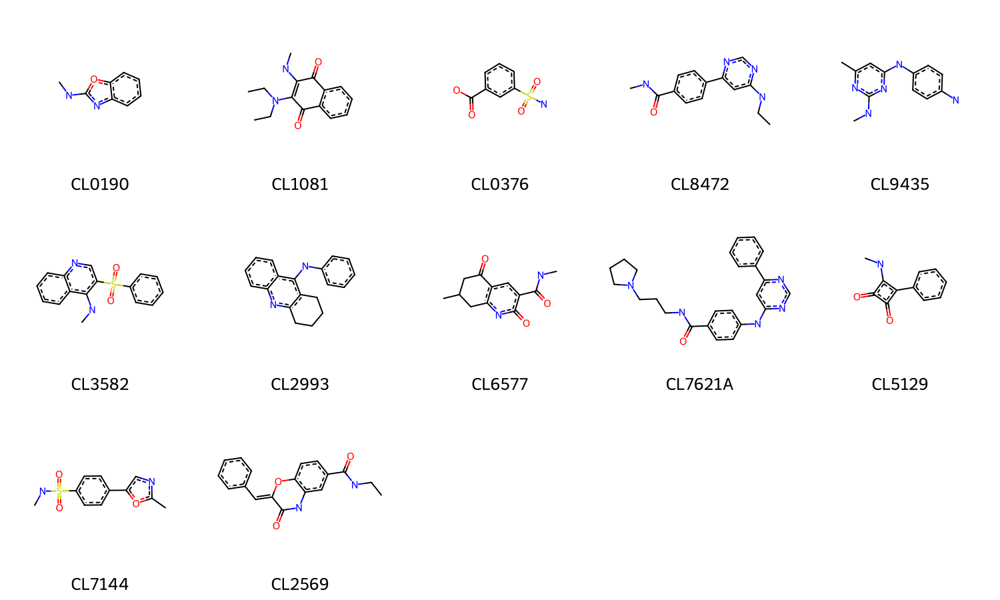

In [87]:
from rdkit.Chem import Draw
smarts_mols = [Chem.MolFromSmarts(s) for s in smarts_int]
img = Draw.MolsToGridImage(
    smarts_mols, 
    molsPerRow=4, 
    subImgSize=(250, 250), # Adjust size if they look too small
    legends=unique_to_predictions
)

# 1. Set up your drawing options for the legend
dopts = Draw.rdMolDraw2D.MolDrawOptions()
dopts.legendFontSize = 25  # Large and clear
dopts.minFontSize = 15
# 1. Generate the SVG object
svg_obj = Draw.MolsToGridImage(
    smarts_mols, 
    molsPerRow=5, 
    subImgSize=(300, 300), 
    legends=unique_to_predictions,
    drawOptions=dopts,
    useSVG=True
)
display(svg_obj)

BXPC3 229 27 12
CAPAN2 230 24 13
CFPAC1 280 21 11
HPAFII 121 22 8
PANC10.05 272 13 7
SW1990 290 27 14


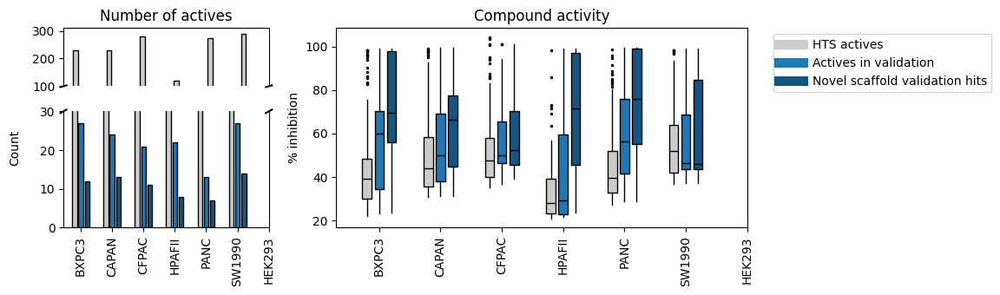

In [92]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# 1. Setup a complex layout: 2 rows for the broken bar plot, 1 column for boxplot
# Width ratios: 1 (for bars) to 2 (for boxplots)
# Height ratios: 1 (top of bars) to 2 (bottom of bars)
fig = plt.figure(figsize=(12, 3.5))
gs = GridSpec(2, 2, width_ratios=[1, 2], height_ratios=[1, 2], figure=fig)

# ax1_top and ax1_bot handle the broken Y-axis for counts
ax1_top = fig.add_subplot(gs[0, 0])
ax1_bot = fig.add_subplot(gs[1, 0])
# ax2 handles the boxplots (occupies both rows in the second column)
ax2 = fig.add_subplot(gs[:, 1])

deviation = 0.2
box_width = 0.15
positions = np.arange(len(int_clls))

COLOR_HTS = "#cccccc"
COLOR_PRED = "#1f77b4"
COLOR_NEW_SC = "#165582"

# Styles
boxprops = {"linewidth": 1, "edgecolor": "black"}
whiskerprops = {"linewidth": 1, "color": "black"}
medianprops = {"linewidth": 1, "color": "black"}
flierprops = dict(marker='.', markersize=3, linestyle='none', markeredgecolor='black')

for i, cll in enumerate(int_clls[:-1]): # skip HEKs
    cll = clls2name[cll]
    hts_actives = hts[hts[f"positives {cll}"] == 1][f"%Inh {cll}"].dropna().values
    pred_actives = cpds_to_validate_predictions[cpds_to_validate_predictions[f"actives_{cll}"] == 1][f"%Inh {cll}_mean"].dropna().values
    pred_act_novel_sc = actives_novel_sc[actives_novel_sc[f"actives_{cll}"] == 1][f"%Inh {cll}_mean"].dropna().values
    print(cll, len(hts_actives), len(pred_actives), len(pred_act_novel_sc))
    # --- AX2: Boxplots (Normal plotting) ---
    bp = ax2.boxplot(
        [hts_actives, pred_actives, pred_act_novel_sc],
        positions=[positions[i] - deviation, positions[i], positions[i] + deviation],
        widths=box_width, showfliers=True, showcaps=False, patch_artist=True,
        boxprops=boxprops, whiskerprops=whiskerprops, medianprops=medianprops, flierprops=flierprops
    )
    bp["boxes"][0].set_facecolor(COLOR_HTS)
    bp["boxes"][1].set_facecolor(COLOR_PRED)
    bp["boxes"][2].set_facecolor(COLOR_NEW_SC)

    # --- AX1: Barplot (Plot on both top and bottom to create the break) ---
    for ax in [ax1_top, ax1_bot]:
        ax.bar(positions[i] - deviation, len(hts_actives), width=box_width, color=COLOR_HTS, edgecolor='black')
        ax.bar(positions[i], len(pred_actives), width=box_width, color=COLOR_PRED, edgecolor='black')
        ax.bar(positions[i] + deviation, len(pred_act_novel_sc), width=box_width, color=COLOR_NEW_SC, edgecolor='black')

# --- Formatting the Broken Axis (ax1) ---
ax1_top.set_ylim(100, 310)  # Top part scale
ax1_bot.set_ylim(0, 30)      # Bottom part scale

# Hide the spines between the two subplots
ax1_top.spines['bottom'].set_visible(False)
ax1_bot.spines['top'].set_visible(False)
ax1_top.xaxis.set_visible(False) # Hide top x-axis labels

# Add the "break" diagonal lines
d = .015 
kwargs = dict(transform=ax1_top.transAxes, color='k', clip_on=False)
ax1_top.plot((-d, +d), (-d, +d), **kwargs)        # top-left diagonal
ax1_top.plot((1 - d, 1 + d), (-d, +d), **kwargs)  # top-right diagonal

kwargs.update(transform=ax1_bot.transAxes) 
ax1_bot.plot((-d, +d), (1 - d, 1 + d), **kwargs)  # bottom-left diagonal
ax1_bot.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs) # bottom-right diagonal

# Shared formatting for bars
ax1_bot.set_xticks(positions)
ax1_bot.set_xticklabels(int_clls, rotation=90)
fig.text(0.04, 0.5, 'Count', va='center', rotation='vertical') # Common Y label
ax1_top.set_title("Number of actives")

# --- Formatting AX2 ---
ax2.set_xticks(positions)
ax2.set_xticklabels(int_clls, rotation=90)
ax2.set_ylabel("% inhibition")
ax2.set_title("Compound activity")

# Legend
handles = [
    plt.Line2D([0], [0], color=COLOR_HTS, lw=8, label="HTS actives"),
    plt.Line2D([0], [0], color=COLOR_PRED, lw=8, label="Actives in validation"),
    plt.Line2D([0], [0], color=COLOR_NEW_SC, lw=8, label="Novel scaffold validation hits")
]
ax2.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout(rect=[0.05, 0, 1, 1]) # Adjust to make room for common Y label
plt.show()